In [ ]:
!conda install tqdm -y

In [1]:
import tqdm

In [2]:
from pfm_utils import readPFM

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
import torch
from DispNet import DispNet
import argparse

parser = argparse.ArgumentParser()
parser.add_argument('--lr', '--learning-rate', default=2e-4, type=float,
                    metavar='LR', help='initial learning rate')
parser.add_argument('--momentum', default=0.9, type=float, metavar='M',
                    help='momentum for sgd, alpha parameter for adam')
parser.add_argument('--beta', default=0.999, type=float, metavar='M',
                    help='beta parameters for adam')
parser.add_argument('--weight-decay', '--wd', default=0, type=float,
                    metavar='W', help='weight decay')
parser.add_argument('--epochs', default=200, type=int, metavar='N',
                    help='number of total epochs to run')
parser.add_argument('-b', '--batch-size', default=6, type=int,
                    metavar='N', help='mini-batch size')
parser.add_argument('-j', '--workers', default=8, type=int, metavar='N',
                    help='number of data loading workers')

args = parser.parse_args(["--lr", "0.0001"])

In [5]:
#FIXME add loading from weights
# weights = torch.load('dispnet_model_best.pth.tar')
# disp_net.load_state_dict(weights['state_dict'])

In [6]:
args

Namespace(batch_size=6, beta=0.999, epochs=200, lr=0.0001, momentum=0.9, weight_decay=0, workers=8)

In [7]:
import torchvision

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, left_img, right_img, disp_map):
        for t in self.transforms:
            left_img, right_img, disp_map = t(left_img, right_img, disp_map)
        return left_img, right_img, disp_map


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, left_img, right_img, disp_map):
        for tensor in [left_img, right_img]:
            for t, m, s in zip(tensor, self.mean, self.std):
                t.sub_(m).div_(s)
        return left_img, right_img, disp_map
    

class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, left_img, right_img, disp_map):
        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W

        left_img = torch.from_numpy(left_img.transpose((2, 0, 1)))
        right_img = torch.from_numpy(right_img.transpose((2, 0, 1)))
        disp_map = torch.from_numpy(disp_map.copy())
       
        return left_img, right_img, disp_map
    


train_transform = Compose([
    ToTensor(),
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


In [8]:
import os

filenames = []
for root, dirs, files in os.walk("data/frames_cleanpass_webp/"):
    if files and os.path.basename(root) == "left": #and os.path.basename(os.path.dirname(root)) == "slow"
        filenames.extend([os.path.join(root, fname) for fname in files])

In [9]:
len(filenames)

4400

In [10]:
import random

random.shuffle(filenames)
filenames[:10]

['data/frames_cleanpass_webp/35mm_focallength/scene_forwards/slow/left/0736.webp',
 'data/frames_cleanpass_webp/15mm_focallength/scene_forwards/slow/left/0716.webp',
 'data/frames_cleanpass_webp/15mm_focallength/scene_forwards/slow/left/0065.webp',
 'data/frames_cleanpass_webp/35mm_focallength/scene_forwards/slow/left/0097.webp',
 'data/frames_cleanpass_webp/35mm_focallength/scene_forwards/fast/left/0243.webp',
 'data/frames_cleanpass_webp/35mm_focallength/scene_backwards/fast/left/0127.webp',
 'data/frames_cleanpass_webp/35mm_focallength/scene_forwards/slow/left/0420.webp',
 'data/frames_cleanpass_webp/35mm_focallength/scene_backwards/slow/left/0189.webp',
 'data/frames_cleanpass_webp/35mm_focallength/scene_backwards/slow/left/0174.webp',
 'data/frames_cleanpass_webp/15mm_focallength/scene_forwards/slow/left/0280.webp']

In [11]:
train_fnames, test_fnames, val_fnames = filenames[:3600], filenames[3600:4300], filenames[4300:]

In [12]:
from data_loader import SequenceFolder

#3600 objects
train_set = SequenceFolder(train_fnames, transform=train_transform)
train_loader = torch.utils.data.DataLoader(
    train_set, batch_size=args.batch_size, shuffle=True,
    num_workers=args.workers, pin_memory=True) #pin_memory=False

#100 objects
val_set = SequenceFolder(val_fnames, transform=train_transform)
val_loader = torch.utils.data.DataLoader(
    val_set, batch_size=1, shuffle=True,
    num_workers=args.workers, pin_memory=True)

Text(0.5,1,'Right')

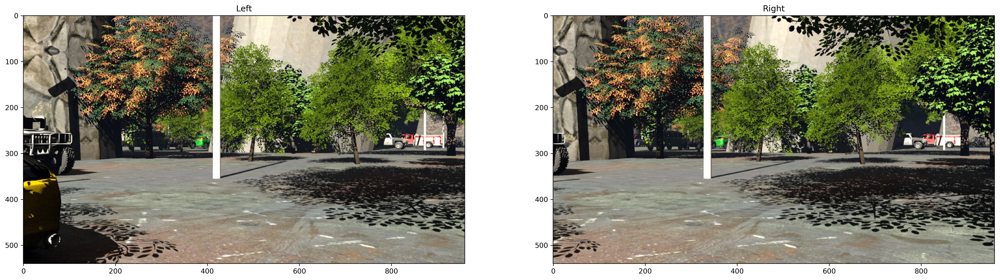

In [66]:
ind = 3
left_img, right_img, disp_map = train_set[ind]
left_img = left_img.numpy().transpose((1,2,0))
right_img = right_img.numpy().transpose((1,2,0))


plt.figure(num=None, figsize=(25,10),dpi=300)
plt.subplot(121)
plt.imshow((left_img+1)/2)
plt.title("Left")

plt.subplot(122)
plt.imshow((right_img+1)/2)
plt.title("Right")

In [13]:
import numpy as np
import torch
from os.path import join
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import time

%matplotlib inline

In [68]:
from seg_model import SqueezeSeg

In [15]:
seg_net = SqueezeSeg()
seg_net.cuda()

SqueezeSeg(
  (conv1a): myconv(
    (conv): Conv2d(6, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (batch): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
  )
  (conv1b): myconv(
    (conv): Conv2d(6, 64, kernel_size=(1, 1), stride=(1, 1))
    (batch): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
  )
  (pool1): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=1, ceil_mode=False)
  (fire2): myfire(
    (convinit): myconv(
      (conv): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (batch): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
    )
    (conv1): myconv(
      (conv): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (batch): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
   

In [16]:
#seg_net(Variable(torch.FloatTensor(arr).cuda())).size()

In [17]:
N = len(train_set)

In [18]:
parameters = seg_net.parameters()
optimizer = torch.optim.Adam(parameters, args.lr,
                             betas=(args.momentum, args.beta),
                             weight_decay=args.weight_decay)

In [19]:
import numpy as np
import torch.nn as nn
from torch.autograd import Variable
# import tqdm
import time

loss_func = nn.MSELoss()
train_loss = []
val_loss = []


for epoch in range(args.epochs):
    seg_net.train()
    start_time = time.time()
    for left_img, right_img, disp_map in tqdm.tqdm(train_loader):
        optimizer.zero_grad()
        X_batch = Variable(torch.cat((left_img, right_img), 1).float())
        y_batch = Variable(disp_map)
        disp1 = seg_net(X_batch.cuda()) #concatenate on channel
        pred = disp1.squeeze(1)
        loss = loss_func(pred, y_batch.cuda())
        train_loss.append(np.asscalar(loss.data.cpu().numpy()))
        loss.backward()
        optimizer.step()
        
    torch.cuda.empty_cache()     
    print("Epoch {} of {} took {:.3f}s".format(
        epoch + 1, args.epochs, time.time() - start_time))
    print("  training loss (in-iteration): \t{:.6f}".format(
        np.mean(train_loss[-N // args.batch_size :])))
    with open('log', 'a') as f:
        f.write("Epoch {} of {} took {:.3f}s\n".format(
        epoch + 1, args.epochs, time.time() - start_time))
        f.write("  training loss (in-iteration): \t{:.6f}\n\n".format(
        np.mean(train_loss[-N // 1 :])))

    # And a full pass over the validation data:
    # disable dropout / use averages for batch_norm    
    seg_net.eval()
    for left_img, right_img, disp_map in val_loader:
        X_batch = Variable(torch.cat((left_img, right_img), 1).float())
        y_batch = Variable(disp_map)
        disp1 = seg_net(X_batch.cuda()) #concatenate on channel
        pred = disp1.squeeze(1)
        loss = loss_func(pred, y_batch.cuda())
        val_loss.append(np.asscalar(loss.data.cpu().numpy()))
        
    print("  validation loss: \t\t\t{:.6f}".format(
        np.mean(val_loss[-N // args.batch_size :])))

100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 1 of 200 took 294.484s
  training loss (in-iteration): 	11257.033895



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			8422.693394


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 2 of 200 took 297.147s
  training loss (in-iteration): 	5389.886576


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			3017.854719


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]

Epoch 3 of 200 took 295.709s
  training loss (in-iteration): 	1843.249067



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			1151.355178


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 4 of 200 took 295.658s
  training loss (in-iteration): 	725.233891


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			456.725316


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 5 of 200 took 296.074s
  training loss (in-iteration): 	461.668062


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			375.516616


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 6 of 200 took 296.087s
  training loss (in-iteration): 	390.656479


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			324.344816


100%|██████████| 600/600 [04:56<00:00,  2.03it/s]

Epoch 7 of 200 took 296.418s
  training loss (in-iteration): 	334.126380



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			283.864975


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 8 of 200 took 298.595s
  training loss (in-iteration): 	299.053354


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			246.710358


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 9 of 200 took 295.449s
  training loss (in-iteration): 	266.933504


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			231.022450


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 10 of 200 took 296.225s
  training loss (in-iteration): 	242.360008


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			202.147481


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 11 of 200 took 295.453s
  training loss (in-iteration): 	223.590370


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			206.019345


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 12 of 200 took 294.903s
  training loss (in-iteration): 	200.583222


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			188.665788


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 13 of 200 took 295.578s
  training loss (in-iteration): 	192.646313


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			263.839289


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 14 of 200 took 295.679s
  training loss (in-iteration): 	185.808394


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			162.920482


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 15 of 200 took 296.268s
  training loss (in-iteration): 	172.238011


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			140.632010


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 16 of 200 took 294.771s
  training loss (in-iteration): 	168.927931


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			143.065494


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]

Epoch 17 of 200 took 295.357s
  training loss (in-iteration): 	161.983130



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			142.183447


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 18 of 200 took 295.511s
  training loss (in-iteration): 	155.959516


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			156.685255


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 19 of 200 took 295.366s
  training loss (in-iteration): 	149.941575


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			172.067074


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 20 of 200 took 295.348s
  training loss (in-iteration): 	146.510407


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			130.569803


100%|██████████| 600/600 [04:57<00:00,  2.01it/s]


Epoch 21 of 200 took 298.106s
  training loss (in-iteration): 	137.813890


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			118.479219


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 22 of 200 took 297.069s
  training loss (in-iteration): 	136.571730


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			136.940820


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]

Epoch 23 of 200 took 296.513s
  training loss (in-iteration): 	128.185198



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			127.169538


100%|██████████| 600/600 [04:56<00:00,  2.03it/s]


Epoch 24 of 200 took 296.432s
  training loss (in-iteration): 	137.920623


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			115.081347


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 25 of 200 took 296.546s
  training loss (in-iteration): 	120.983310


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			135.544195


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 26 of 200 took 296.557s
  training loss (in-iteration): 	121.069978


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			106.279520


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 27 of 200 took 296.648s
  training loss (in-iteration): 	118.554270


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			127.007750


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]


Epoch 28 of 200 took 296.647s
  training loss (in-iteration): 	115.032603


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			100.557940


100%|██████████| 600/600 [04:57<00:00,  2.02it/s]


Epoch 29 of 200 took 297.301s
  training loss (in-iteration): 	114.496123


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			121.220404


100%|██████████| 600/600 [04:56<00:00,  2.03it/s]

Epoch 30 of 200 took 296.482s
  training loss (in-iteration): 	109.252778



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			106.991447


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]


Epoch 31 of 200 took 296.872s
  training loss (in-iteration): 	108.262196


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			109.418390


100%|██████████| 600/600 [04:56<00:00,  2.02it/s]

Epoch 32 of 200 took 296.576s
  training loss (in-iteration): 	105.205940



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			147.410498


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 33 of 200 took 294.672s
  training loss (in-iteration): 	104.821679


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			155.444657


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 34 of 200 took 294.408s
  training loss (in-iteration): 	100.356414



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			98.180030


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 35 of 200 took 294.690s
  training loss (in-iteration): 	103.094772


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			101.081995


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 36 of 200 took 294.587s
  training loss (in-iteration): 	97.660514


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			98.857046


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 37 of 200 took 294.604s
  training loss (in-iteration): 	96.418761



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			98.594956


100%|██████████| 600/600 [04:55<00:00,  2.03it/s]

Epoch 38 of 200 took 295.391s
  training loss (in-iteration): 	95.879669



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			95.142946


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 39 of 200 took 294.623s
  training loss (in-iteration): 	93.013767



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			82.472564


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 40 of 200 took 295.041s
  training loss (in-iteration): 	91.105462


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			120.935701


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 41 of 200 took 294.912s
  training loss (in-iteration): 	93.390984



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			103.828378


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 42 of 200 took 294.706s
  training loss (in-iteration): 	87.526036



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			103.506126


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 43 of 200 took 294.736s
  training loss (in-iteration): 	88.194568



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			92.513354


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 44 of 200 took 294.338s
  training loss (in-iteration): 	86.322312


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			122.253149


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 45 of 200 took 294.966s
  training loss (in-iteration): 	90.062543


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			89.129950


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 46 of 200 took 294.471s
  training loss (in-iteration): 	83.424233



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			98.492945


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 47 of 200 took 294.515s
  training loss (in-iteration): 	85.158466


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			81.899653


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 48 of 200 took 294.423s
  training loss (in-iteration): 	81.584854



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			78.874868


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 49 of 200 took 294.541s
  training loss (in-iteration): 	79.865578


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			83.232289


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 50 of 200 took 294.671s
  training loss (in-iteration): 	80.524238



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			76.307735


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 51 of 200 took 294.618s
  training loss (in-iteration): 	78.707966



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			101.400909


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 52 of 200 took 294.237s
  training loss (in-iteration): 	82.815713



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			79.020975


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 53 of 200 took 295.047s
  training loss (in-iteration): 	77.239561


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			89.952563


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 54 of 200 took 294.430s
  training loss (in-iteration): 	74.084871



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			71.079133


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 55 of 200 took 294.526s
  training loss (in-iteration): 	74.359210


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			86.906920


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 56 of 200 took 294.470s
  training loss (in-iteration): 	75.335473



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			95.257407


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 57 of 200 took 294.707s
  training loss (in-iteration): 	73.070024


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			63.530949


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]

Epoch 58 of 200 took 294.528s
  training loss (in-iteration): 	72.648724



  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			71.450526


100%|██████████| 600/600 [04:54<00:00,  2.04it/s]


Epoch 59 of 200 took 294.815s
  training loss (in-iteration): 	74.544926


  0%|          | 0/600 [00:00<?, ?it/s]

  validation loss: 			74.760440


 81%|████████  | 484/600 [03:57<00:57,  2.03it/s]Process Process-946:
Process Process-945:
Process Process-952:
Process Process-947:
Process Process-951:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Process Process-950:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/opt/conda/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **

KeyboardInterrupt: 

In [20]:
torch.save(seg_net,"seg_model_14.05_last.pth")

/opt/conda/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type SqueezeSeg. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type myconv. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type myfire. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type myfireup. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/s

In [29]:
len(train_loss)

35885

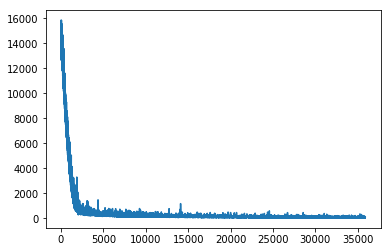

In [21]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(np.asarray(train_loss))

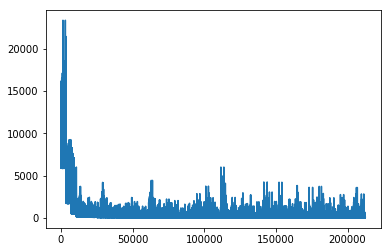

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(np.asarray(val_loss))

In [23]:
np.save('train_loss',train_loss)
np.save('val_loss',val_loss)

In [29]:
len(train_loss)

2400

In [ ]:
print("OK")

In [24]:
seg_net.eval()

#700 objects
test_set = SequenceFolder(test_fnames, transform=train_transform)
test_loader = torch.utils.data.DataLoader(
    test_set, batch_size=1, shuffle=True,
    num_workers=args.workers, pin_memory=True)

test_loss = []
for left_img, right_img, disp_map in test_loader:
    X_batch = Variable(torch.cat((left_img, right_img), 1).float())
    y_batch = Variable(disp_map)
    disp1 = seg_net(X_batch.cuda()) #concatenate on channel
    pred = disp1.squeeze(1)
    loss = loss_func(pred, y_batch.cuda())
    test_loss.append(np.asscalar(loss.data.cpu().numpy()))

print("  test loss: \t\t\t{:.6f}".format(
    np.mean(val_loss[-N // args.batch_size :])))

  test loss: 			74.760440


In [34]:
ind = 0
seg_net.eval()
left_img, right_img, disp_map = test_set[ind]
X = torch.Tensor(np.concatenate((left_img, right_img), 0)).unsqueeze(0)
disp1 = seg_net(X.cuda())

Text(0.5,1,'Right')

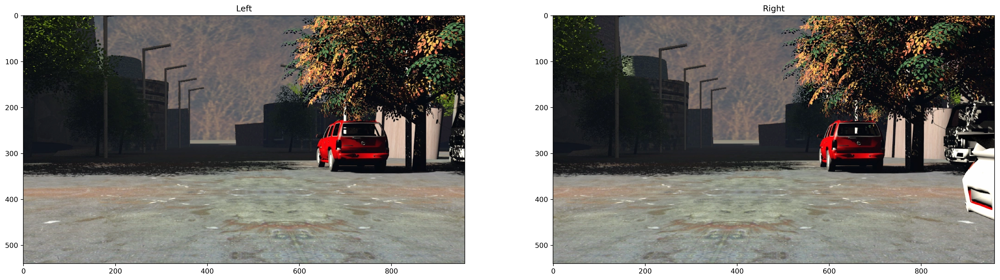

In [63]:
left_img = left_img.numpy().transpose((1,2,0))
right_img = right_img.numpy().transpose((1,2,0))


plt.figure(num=None, figsize=(25,10),dpi=300)
plt.subplot(121)
plt.imshow((left_img+1)/2)
plt.title("Left")

plt.subplot(122)
plt.imshow((right_img+1)/2)
plt.title("Right")

In [69]:
l1 = nn.L1Loss(size_average=False)

In [73]:
for param in seg_net.parameters():
    l1(param,torch.zeros_like(param))

Text(0.5,1,'Pred - disp')

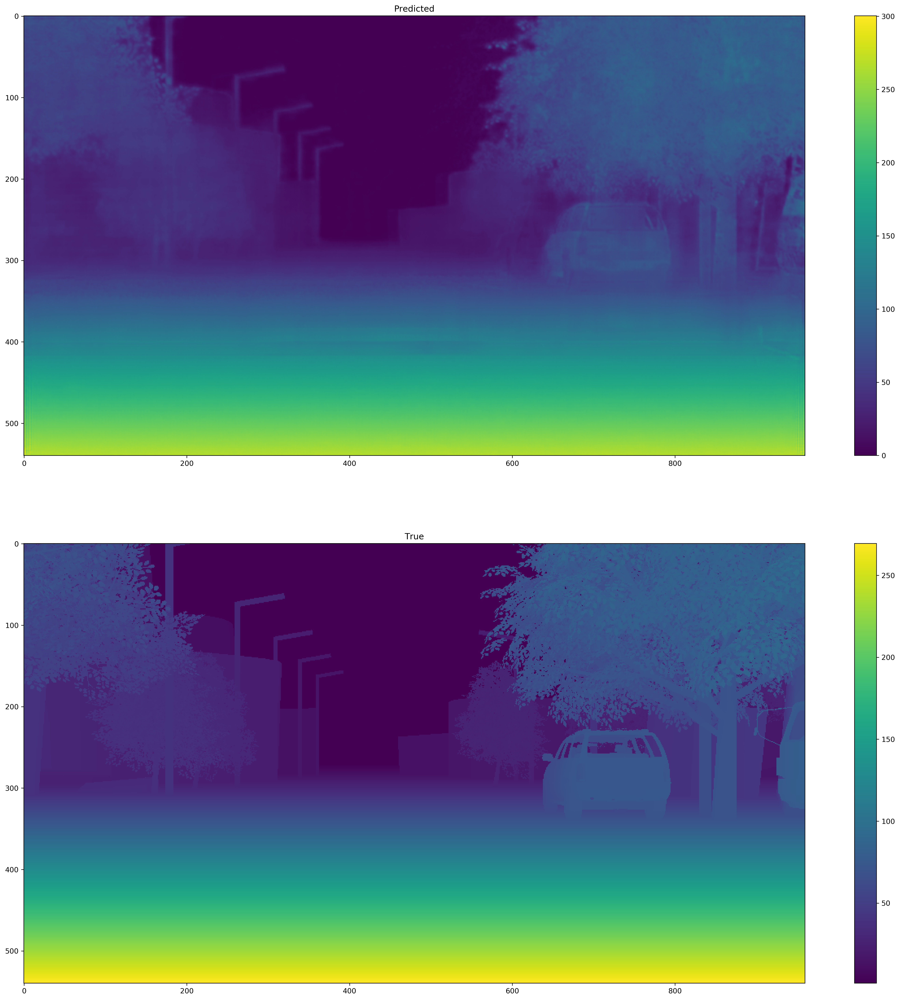

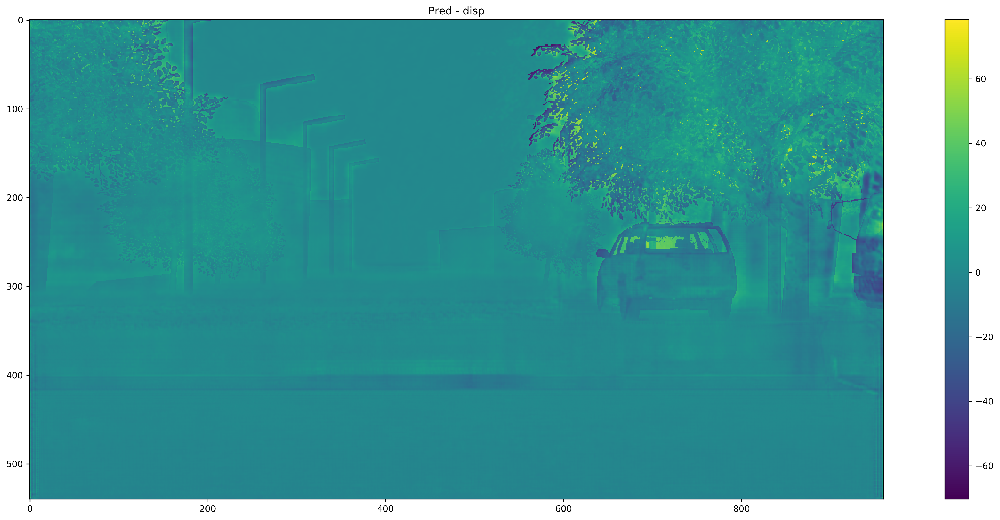

In [53]:
plt.figure(num=None, figsize=(25,25),dpi=300)
plt.subplot(211)
plt.imshow(pred_disp)
plt.title("Predicted")
plt.colorbar()
plt.subplot(212)
plt.imshow(disp_map)
plt.colorbar()
plt.title("True")

plt.figure(num=None, figsize=(25,10),dpi=300)
plt.imshow(pred_disp-disp_map)
plt.colorbar()
plt.title("Pred - disp")

In [23]:
np.concatenate((left_img, right_img), 0).shape

(6, 540, 960)

In [42]:
from PIL import Image
left_img = np.asarray(Image.open('data/frames_cleanpass_webp/35mm_focallength/scene_backwards/fast/left/0001.webp').convert("RGB"))
right_img = np.asarray(Image.open('data/frames_cleanpass_webp/35mm_focallength/scene_backwards/fast/right/0001.webp').convert("RGB"))
_, t = np.asarray(readPFM('data/disparity/35mm_focallength/scene_backwards/fast/left/0001.pfm'))

In [43]:
# left_img, right_img, _ = train_set[0]
X = torch.Tensor(np.concatenate((left_img, right_img), 2).transpose((2,0,1))).float()
disp1 = seg(X.unsqueeze(0).cuda())

In [44]:
_

array([[ 45.443966,  50.0488  ,  60.571693, ...,  21.9227  ,  21.924547,
         21.9264  ],
       [ 45.422718,  60.52275 ,  60.53415 , ...,  21.91864 ,  21.920492,
         21.922342],
       [ 42.89609 ,  50.08229 ,  45.33303 , ...,  21.914581,  21.916431,
         21.918283],
       ...,
       [267.51294 , 267.5128  , 267.513   , ..., 267.5127  , 267.51257 ,
        267.5127  ],
       [268.51282 , 268.5126  , 268.5127  , ..., 268.5124  , 268.5125  ,
        268.51257 ],
       [269.5126  , 269.5127  , 269.51254 , ..., 269.5125  , 269.51266 ,
        269.5125  ]], dtype=float32)

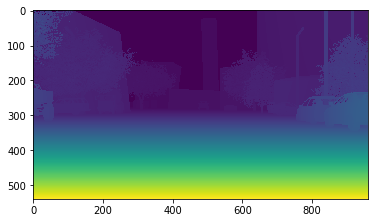

In [45]:
plt.imshow(np.asarray(_))

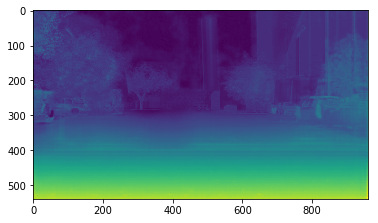

In [50]:
plt.imshow(disp1.cpu().data.numpy().reshape((540, 960)))
#plt.colorbar()

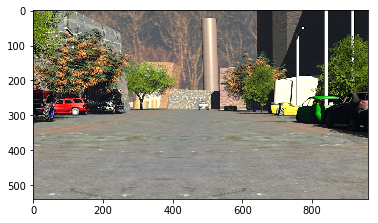

In [49]:
plt.imshow(left_img)

In [19]:
np.asarray(left_img).transpose((1,2,0)).shape

(540, 960, 3)

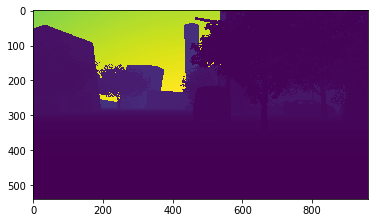

In [20]:
plt.imshow(1/_.data.numpy())

In [17]:
left_img.data.numpy().shape

(3, 540, 960)

In [11]:
disp1.cpu().data.numpy().shape

(1, 1, 540, 1920)

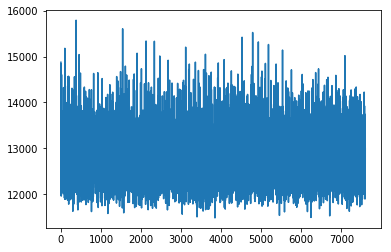

In [10]:
plt.plot(np.asarray(train_loss))

In [2]:
!conda install tqdm -y

Solving environment: done

## Package Plan ##

  environment location: /opt/conda

  added / updated specs: 
    - tqdm


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    tqdm-4.23.0                |           py36_0          56 KB

The following NEW packages will be INSTALLED:

    tqdm: 4.23.0-py36_0


tqdm 4.23.0############################################################# | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done


In [8]:
for left_img, right_img, disp_map in train_loader:
    break

In [11]:
torch.cat((left_img, right_img), 0).size()

torch.Size([8, 3, 540, 960])

In [24]:
import os
path = "left"
for (dirpath, dirnames, filenames) in os.walk(path):
    print(dirpath, dirnames, filenames)

left [] ['0400.png']


In [17]:
os.listdir('data/frames_cleanpass_webp/35mm_focallength/scene_backwards/fast/left')

['0075.webp',
 '0206.webp',
 '0228.webp',
 '0202.webp',
 '0155.webp',
 '0295.webp',
 '0214.webp',
 '0008.webp',
 '0229.webp',
 '0089.webp',
 '0175.webp',
 '0227.webp',
 '0240.webp',
 '0038.webp',
 '0149.webp',
 '0136.webp',
 '0070.webp',
 '0002.webp',
 '0212.webp',
 '0020.webp',
 '0172.webp',
 '0195.webp',
 '0274.webp',
 '0119.webp',
 '0049.webp',
 '0226.webp',
 '0143.webp',
 '0013.webp',
 '0271.webp',
 '0185.webp',
 '0247.webp',
 '0006.webp',
 '0004.webp',
 '0137.webp',
 '0246.webp',
 '0165.webp',
 '0150.webp',
 '0281.webp',
 '0011.webp',
 '0029.webp',
 '0114.webp',
 '0198.webp',
 '0223.webp',
 '0210.webp',
 '0050.webp',
 '0154.webp',
 '0076.webp',
 '0187.webp',
 '0042.webp',
 '0183.webp',
 '0125.webp',
 '0205.webp',
 '0083.webp',
 '0028.webp',
 '0110.webp',
 '0287.webp',
 '0065.webp',
 '0043.webp',
 '0104.webp',
 '0095.webp',
 '0253.webp',
 '0291.webp',
 '0003.webp',
 '0098.webp',
 '0115.webp',
 '0064.webp',
 '0237.webp',
 '0063.webp',
 '0080.webp',
 '0243.webp',
 '0232.webp',
 '0058

In [3]:
from PIL import Image

a = ['0400.png', '0401.png']
arr = []
for fname in a:
    left_img = Image.open("left/"+fname).convert("RGB")
    right_img = Image.open("right/"+fname).convert("RGB")
    img = np.concatenate((left_img, right_img), axis=2)
    arr.append(img.transpose((2, 0, 1)))
    
arr = np.array(arr)
arr = arr/255.0
arr.shape

In [39]:
def get_new_path(path, new_dir):
    dir_path, filename = os.path.split(path)
    dir_path, _ = os.path.split(dir_path)
    return os.path.join(dir_path, new_dir, filename)

In [26]:
len(os.listdir('data/frames_cleanpass_webp/35mm_focallength/scene_forwards/fast/left'))

300

In [42]:
import scipy

In [4]:
import PIL
from PIL import Image

In [27]:
t = Image.open('data/frames_cleanpass_webp/35mm_focallength/scene_forwards/fast/left/0001.webp').convert("RGB")

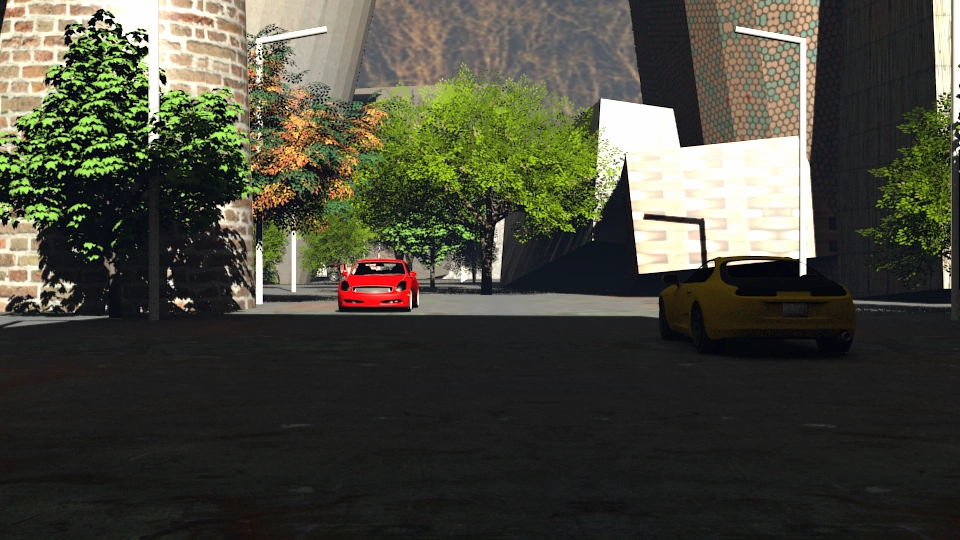

In [28]:
t.

In [1]:
get_new_path('data/frames_cleanpass_webp/35mm_focallength/scene_backwards/slow/left/', 'right')

NameError: name 'get_new_path' is not defined

In [1]:
from data_loader import SequenceFolder

In [2]:
t = SequenceFolder()

In [22]:
t[0]

(array([[[122, 113, 109],
         [121, 112, 108],
         [121, 112, 106],
         ...,
         [ 25,  30,  15],
         [ 20,  26,  17],
         [ 24,  32,  25]],
 
        [[130, 121, 117],
         [125, 117, 113],
         [121, 112, 106],
         ...,
         [ 46,  55,  27],
         [ 36,  46,  27],
         [ 27,  36,  21]],
 
        [[129, 121, 114],
         [123, 115, 108],
         [118, 110, 106],
         ...,
         [ 64,  79,  26],
         [ 59,  74,  35],
         [ 38,  52,  20]],
 
        ...,
 
        [[174, 137, 127],
         [173, 136, 123],
         [174, 137, 125],
         ...,
         [153, 151, 151],
         [151, 148, 149],
         [149, 147, 148]],
 
        [[174, 137, 125],
         [173, 136, 121],
         [173, 137, 119],
         ...,
         [150, 150, 150],
         [151, 151, 151],
         [154, 154, 154]],
 
        [[173, 136, 121],
         [174, 138, 122],
         [174, 138, 120],
         ...,
         [153, 153, 153],
  

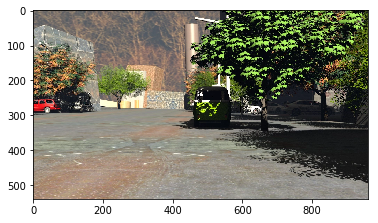

In [8]:
plt.imshow(l)

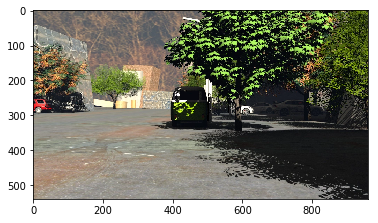

In [9]:
plt.imshow(r)

In [14]:
d[0]

array([[  1.4209507,   1.4204493,   1.4199477, ...,  47.51297  ,
         48.21009  ,  48.36211  ],
       [  1.4201981,   1.4196966,   1.4191952, ...,  47.55001  ,
         48.23235  ,  48.417355 ],
       [  1.4194456,   1.418944 ,   1.4184425, ...,  74.373116 ,
         74.36311  ,  48.472607 ],
       ...,
       [267.51288  , 267.5128   , 267.51273  , ..., 267.5128   ,
        267.5127   , 267.51285  ],
       [268.51254  , 268.51273  , 268.51273  , ..., 268.513    ,
        268.51294  , 268.51288  ],
       [269.51276  , 269.51276  , 269.5127   , ..., 269.51276  ,
        269.51273  , 269.51263  ]], dtype=float32)

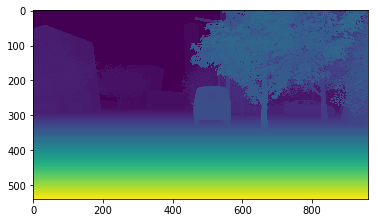

In [13]:
plt.imshow(d[0])

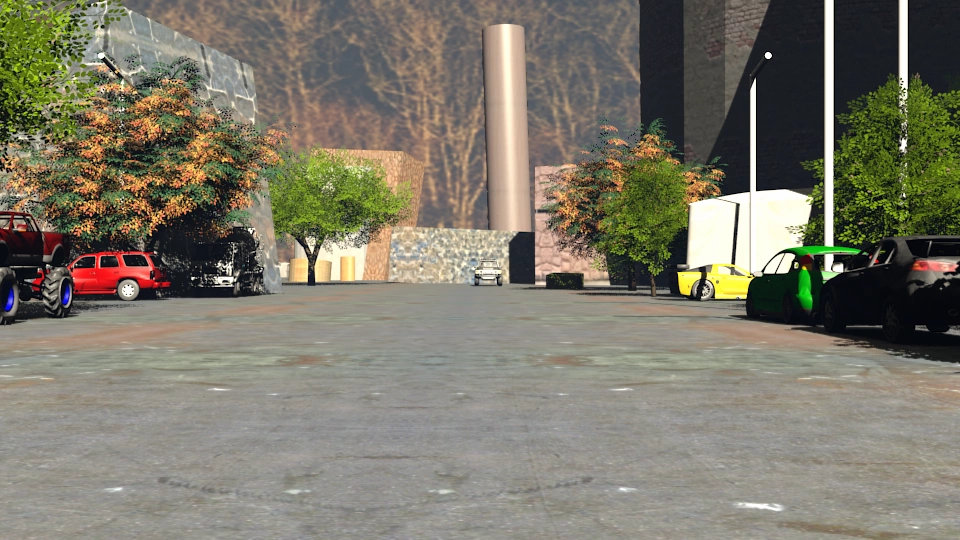

In [32]:
t = Image.open('data/frames_cleanpass_webp/35mm_focallength/scene_backwards/slow/left/0001.webp').convert("RGB")
t

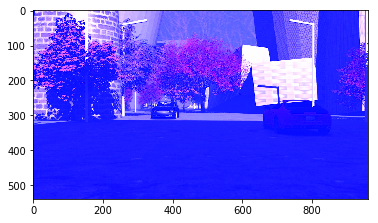

In [19]:
import numpy as np
plt.imshow(np.asarray(t)[:,:,1:4])

In [17]:
np.asarray(t)[:3].shape

(3, 960, 4)

In [8]:
dir(PIL)
PIL.version

<module 'PIL.version' from '/opt/conda/lib/python3.6/site-packages/PIL/version.py'>

In [13]:
PIL.PILLOW_VERSION

'5.1.0'

In [10]:
dir(PIL)

['BlpImagePlugin',
 'BmpImagePlugin',
 'BufrStubImagePlugin',
 'CurImagePlugin',
 'DcxImagePlugin',
 'DdsImagePlugin',
 'EpsImagePlugin',
 'FitsStubImagePlugin',
 'FliImagePlugin',
 'FpxImagePlugin',
 'FtexImagePlugin',
 'GbrImagePlugin',
 'GifImagePlugin',
 'GimpGradientFile',
 'GimpPaletteFile',
 'GribStubImagePlugin',
 'Hdf5StubImagePlugin',
 'IcnsImagePlugin',
 'IcoImagePlugin',
 'ImImagePlugin',
 'Image',
 'ImageChops',
 'ImageColor',
 'ImageFile',
 'ImageMode',
 'ImagePalette',
 'ImageSequence',
 'ImtImagePlugin',
 'IptcImagePlugin',
 'Jpeg2KImagePlugin',
 'JpegImagePlugin',
 'JpegPresets',
 'McIdasImagePlugin',
 'MicImagePlugin',
 'MpegImagePlugin',
 'MpoImagePlugin',
 'MspImagePlugin',
 'PILLOW_VERSION',
 'PaletteFile',
 'PalmImagePlugin',
 'PcdImagePlugin',
 'PcxImagePlugin',
 'PdfImagePlugin',
 'PdfParser',
 'PixarImagePlugin',
 'PngImagePlugin',
 'PpmImagePlugin',
 'PsdImagePlugin',
 'SgiImagePlugin',
 'SpiderImagePlugin',
 'SunImagePlugin',
 'TgaImagePlugin',
 'TiffImagePlu